In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go 
import plotly.express as px

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import warnings
warnings.filterwarnings('ignore')


In [2]:
from bs4 import BeautifulSoup
import requests
import regex as re

In [3]:
url="https://ev-database.org/#group=vehicle-group&rs-pr=10000_100000&rs-er=0_1000&rs-ld=0_1000&rs-ac=2_23&rs-dcfc=0_400&rs-ub=10_200&rs-tw=0_2500&rs-ef=100_350&rs-sa=-1_5&rs-w=1000_3500&rs-c=0_5000&rs-y=2010_2030&s=1&p=0-10"

In [4]:
request_headers={"user-agent":
"Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/142.0.0.0 Safari/537.36 Edg/142.0.0.0"}

In [5]:
response=requests.get(url,headers=request_headers)
response

<Response [200]>

In [6]:
pagecontent=response.content
pagecontent

b'\n<!doctype html>\n\n<html lang="en" data-locale="en-IE" data-region="si">\n\t<!-- head -->\n\t<head>\t\t\n\t<meta charset="utf-8" />\n\t\t\t<link rel="canonical" href="https://ev-database.org/">\t<link rel="alternate" hreflang="en-gb" href="https://ev-database.org/uk/">\t<link rel="alternate" hreflang="de-de" href="https://ev-database.org/de/">\t<link rel="alternate" hreflang="nl-nl" href="https://ev-database.org/nl/">\t<link rel="alternate" hreflang="x-default" href="https://ev-database.org/">\t<meta name="viewport" content="width=device-width, initial-scale=1" />\n\t<title>All electric vehicles in Europe - EV Database</title>\n\t\t<meta name="description" content="A complete overview of all electric vehicles in Europe. Search and compare by range, make, model and price.">\n\n\t<meta property="og:title" content="EV Database" />\n\t<meta property="og:description" content="A complete overview of all electric vehicles in Europe. Search and compare by range, make, model and price." />\

In [7]:
soup=BeautifulSoup(pagecontent)
soup

<!DOCTYPE html>
<html data-locale="en-IE" data-region="si" lang="en">
<!-- head -->
<head>
<meta charset="utf-8"/>
<link href="https://ev-database.org/" rel="canonical"/> <link href="https://ev-database.org/uk/" hreflang="en-gb" rel="alternate"/> <link href="https://ev-database.org/de/" hreflang="de-de" rel="alternate"/> <link href="https://ev-database.org/nl/" hreflang="nl-nl" rel="alternate"/> <link href="https://ev-database.org/" hreflang="x-default" rel="alternate"/> <meta content="width=device-width, initial-scale=1" name="viewport"/>
<title>All electric vehicles in Europe - EV Database</title>
<meta content="A complete overview of all electric vehicles in Europe. Search and compare by range, make, model and price." name="description"/>
<meta content="EV Database" property="og:title"/>
<meta content="A complete overview of all electric vehicles in Europe. Search and compare by range, make, model and price." property="og:description"/>
<meta content="website" property="og:type"/>
<

In [8]:
Brand=soup.find("a",attrs={"class":"title"})
Brand

<a class="title" href="/car/3290/BMW-iX3-50-xDrive"><span class="bmw">BMW</span> <span class="model">iX3 50 xDrive <span style="font-size: 13px;">(MY26)</span></span><span class="hidden">BMW iX3 50 xDrive</span></a>

In [9]:
Brand=[]
for x in soup.find_all("a",attrs={"class":"title"}):
    Brand.append(x.text if x else np.nan)

for name in Brand:
    print(name)

BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive
MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh
Mercedes-Benz CLA 250+Mercedes-Benz CLA 250+
BMW iX xDrive40BMW iX xDrive40
Fiat 500e Hatchback 42 kWhFiat 500e Hatchback 42 kWh
CUPRA Born 150 kW - 58 kWhCUPRA Born 150 kW - 58 kWh
Tesla Model Y Long Range AWD (Juniper)Tesla Model Y Long Range AWD
Tesla Model 3 Long Range RWD (Highland)Tesla Model 3 Long Range RWD
CUPRA Born 170 kW - 77 kWhCUPRA Born 170 kW - 77 kWh
Kia EV3 Long RangeKia EV3 Long Range
Tesla Model Y RWD (Juniper)Tesla Model Y RWD
Tesla Model 3 RWD (Highland CATL LFP64)Tesla Model 3 RWD
BYD SEALION 7 91.3 kWh AWD ExcellenceBYD SEALION 7 91.3 kWh AWD Excellence
BYD ATTO 3 (MY23-24)BYD ATTO 3
Mercedes-Benz GLC 400 4MATICMercedes-Benz GLC 400 4MATIC
Tesla Model Y Long Range AWDTesla Model Y Long Range AWD
Tesla Model Y Standard RWD (Juniper)Tesla Model Y Standard RWD
Volvo EX30 Single Motor ER (MY24-26)Volvo EX30 Single Motor ER
Renault 5 E-Tech 52kWh 150hpRenault 5 E-Tech 52kWh 150hp
L

In [10]:
print(len(Brand))

1146


In [11]:
range_in_km=soup.find("span",attrs={"class":"erange_real"})
range_in_km

<span class="erange_real">610 km</span>

In [12]:
range_in_km=[]
for x in soup.find_all("span",attrs={"class":"erange_real"}):
    range_in_km.append(x.text if x else np.nan)

for name in range_in_km:
    print(name)

610 km
360 km
585 km
360 km
235 km
350 km
455 km
580 km
450 km
455 km
375 km
440 km
440 km
330 km
500 km
445 km
380 km
365 km
335 km
360 km
245 km
420 km
550 km
475 km
385 km
450 km
385 km
350 km
385 km
365 km
225 km
190 km
380 km
390 km
445 km
450 km
430 km
685 km
455 km
365 km
445 km
320 km
380 km
300 km
475 km
350 km
315 km
470 km
370 km
385 km
515 km
415 km
460 km
575 km
235 km
475 km
490 km
315 km
390 km
325 km
560 km
275 km
350 km
490 km
555 km
265 km
260 km
525 km
435 km
480 km
370 km
410 km
435 km
570 km
440 km
380 km
255 km
460 km
440 km
405 km
340 km
485 km
400 km
370 km
475 km
395 km
580 km
720 km
420 km
135 km
255 km
455 km
250 km
375 km
565 km
350 km
495 km
370 km
330 km
470 km
420 km
380 km
465 km
280 km
335 km
410 km
490 km
345 km
390 km
400 km
490 km
400 km
505 km
300 km
315 km
330 km
180 km
425 km
410 km
575 km
450 km
300 km
290 km
165 km
455 km
470 km
345 km
395 km
390 km
455 km
240 km
515 km
465 km
360 km
470 km
475 km
420 km
510 km
575 km
390 km
380 km
485 km
600 km

In [13]:
efficiency=soup.find("span",attrs={"class":"efficiency"})
efficiency

<span class="efficiency">178 Wh/km</span>

In [14]:
efficiency=[]
for x in soup.find_all("span",attrs={"class":"efficiency"}):
    efficiency.append(x.text if x else np.nan)

for name in efficiency:
    print(name)

178 Wh/km
171 Wh/km
145 Wh/km
197 Wh/km
159 Wh/km
166 Wh/km
165 Wh/km
136 Wh/km
171 Wh/km
171 Wh/km
160 Wh/km
136 Wh/km
208 Wh/km
183 Wh/km
188 Wh/km
169 Wh/km
158 Wh/km
178 Wh/km
155 Wh/km
181 Wh/km
184 Wh/km
196 Wh/km
136 Wh/km
166 Wh/km
171 Wh/km
171 Wh/km
192 Wh/km
146 Wh/km
168 Wh/km
237 Wh/km
160 Wh/km
168 Wh/km
170 Wh/km
168 Wh/km
173 Wh/km
178 Wh/km
174 Wh/km
172 Wh/km
162 Wh/km
170 Wh/km
185 Wh/km
153 Wh/km
158 Wh/km
153 Wh/km
164 Wh/km
173 Wh/km
165 Wh/km
160 Wh/km
216 Wh/km
177 Wh/km
157 Wh/km
170 Wh/km
172 Wh/km
148 Wh/km
161 Wh/km
198 Wh/km
192 Wh/km
213 Wh/km
164 Wh/km
169 Wh/km
170 Wh/km
159 Wh/km
169 Wh/km
153 Wh/km
142 Wh/km
163 Wh/km
168 Wh/km
143 Wh/km
177 Wh/km
181 Wh/km
185 Wh/km
180 Wh/km
184 Wh/km
169 Wh/km
182 Wh/km
170 Wh/km
157 Wh/km
237 Wh/km
175 Wh/km
189 Wh/km
178 Wh/km
155 Wh/km
195 Wh/km
195 Wh/km
162 Wh/km
168 Wh/km
183 Wh/km
163 Wh/km
136 Wh/km
158 Wh/km
172 Wh/km
165 Wh/km
153 Wh/km
171 Wh/km
168 Wh/km
183 Wh/km
149 Wh/km
176 Wh/km
178 Wh/km
160 Wh/km


In [15]:
weight=soup.find("span",attrs={"class":"weight_p"})
weight

<span class="weight_p">2360 kg</span>

In [16]:
weight=[]
for x in soup.find_all("span",attrs={"class":"weight_p"}):
    weight.append(x.text if x else np.nan)

for name in weight:
    print(name)

2360 kg
1726 kg
2055 kg
2440 kg
1365 kg
1811 kg
2072 kg
1822 kg
1946 kg
1885 kg
2003 kg
1836 kg
2510 kg
1825 kg
2535 kg
2054 kg
1981 kg
1850 kg
1504 kg
1920 kg
1645 kg
2300 kg
1822 kg
2072 kg
2037 kg
2115 kg
2255 kg
1700 kg
1757 kg
2565 kg
1250 kg
1615 kg
2085 kg
1773 kg
2144 kg
2060 kg
2072 kg
2545 kg
1931 kg
1755 kg
2260 kg
1684 kg
1711 kg
1410 kg
1890 kg
1733 kg
1577 kg
1976 kg
2495 kg
2015 kg
2125 kg
2105 kg
2108 kg
2135 kg
1345 kg
2535 kg
2415 kg
2145 kg
1760 kg
1800 kg
2265 kg
1563 kg
1975 kg
1929 kg
1899 kg
1465 kg
1511 kg
1899 kg
2090 kg
1917 kg
1695 kg
1985 kg
2190 kg
2210 kg
2160 kg
1940 kg
1430 kg
2705 kg
2075 kg
2125 kg
1825 kg
1919 kg
2069 kg
1979 kg
2172 kg
2045 kg
2462 kg
2435 kg
1836 kg
1186 kg
1491 kg
1981 kg
1602 kg
1812 kg
2272 kg
1970 kg
1985 kg
1820 kg
1785 kg
1976 kg
2145 kg
2264 kg
1919 kg
2445 kg
1637 kg
2109 kg
2154 kg
1984 kg
1940 kg
2045 kg
1919 kg
1835 kg
2585 kg
1710 kg
1537 kg
1815 kg
1440 kg
2222 kg
2130 kg
2170 kg
2121 kg
1623 kg
1636 kg
1009 kg
1959 kg


In [17]:
acceleration=soup.find("span",attrs={"class":"acceleration_p"})
acceleration

<span class="acceleration_p">4.9 sec</span>

In [18]:
acceleration=[]
for x in soup.find_all("span",attrs={"class":"acceleration_p"}):
    acceleration.append(x.text if x else np.nan)

for name in acceleration:
    print(name)

4.9 sec
7.9 sec
6.7 sec
6.1 sec
9.0 sec
7.3 sec
4.8 sec
5.2 sec
7.0 sec
7.7 sec
5.9 sec
6.1 sec
4.5 sec
7.3 sec
4.3 sec
5.0 sec
7.2 sec
5.3 sec
8.0 sec
8.0 sec
7.9 sec
6.7 sec
5.2 sec
4.8 sec
7.6 sec
6.6 sec
6.8 sec
5.6 sec
7.8 sec
5.7 sec
12.7 sec
9.6 sec
5.6 sec
7.8 sec
6.7 sec
7.5 sec
4.0 sec
6.2 sec
4.6 sec
6.3 sec
3.8 sec
5.6 sec
7.4 sec
10.6 sec
7.7 sec
7.0 sec
11.4 sec
5.6 sec
5.1 sec
7.5 sec
5.7 sec
8.9 sec
3.8 sec
4.9 sec
7.3 sec
3.8 sec
6.0 sec
10.6 sec
7.9 sec
7.5 sec
2.4 sec
8.0 sec
8.5 sec
3.4 sec
4.4 sec
9.1 sec
11.0 sec
4.4 sec
6.4 sec
7.9 sec
8.4 sec
7.3 sec
6.7 sec
4.9 sec
5.2 sec
8.6 sec
12.5 sec
4.9 sec
8.6 sec
8.5 sec
7.3 sec
4.4 sec
8.4 sec
8.1 sec
6.5 sec
8.6 sec
3.9 sec
3.2 sec
6.1 sec
12.6 sec
11.5 sec
7.6 sec
9.7 sec
7.8 sec
2.4 sec
7.5 sec
7.4 sec
5.5 sec
7.6 sec
5.6 sec
6.7 sec
4.0 sec
4.4 sec
6.8 sec
7.7 sec
8.5 sec
7.5 sec
6.9 sec
8.3 sec
7.5 sec
4.4 sec
6.1 sec
4.6 sec
7.7 sec
8.2 sec
6.9 sec
7.3 sec
9.6 sec
6.6 sec
3.2 sec
7.6 sec
9.1 sec
9.7 sec
19.1 sec

In [19]:
long_distance_total=soup.find("span",attrs={"class":"long_distance_total"})
long_distance_total

<span class="long_distance_total">742 km</span>

In [20]:
long_distance_total=[]
for x in soup.find_all("span",attrs={"class":"long_distance_total"}):
    long_distance_total.append(x.text if x else np.nan)

for name in long_distance_total:
    print(name)

742 km
405 km
763 km
388 km
261 km
375 km
535 km
688 km
488 km
472 km
438 km
520 km
502 km
325 km
606 km
524 km
440 km
411 km
348 km
403 km
235 km
440 km
655 km
556 km
453 km
493 km
411 km
421 km
365 km
384 km
212 km
178 km
407 km
391 km
490 km
560 km
506 km
731 km
560 km
387 km
472 km
389 km
410 km
311 km
498 km
338 km
274 km
552 km
366 km
448 km
584 km
414 km
535 km
746 km
222 km
614 km
630 km
328 km
363 km
341 km
636 km
312 km
405 km
585 km
654 km
275 km
270 km
629 km
452 km
481 km
352 km
514 km
559 km
730 km
549 km
405 km
254 km
444 km
468 km
430 km
348 km
577 km
421 km
368 km
541 km
405 km
698 km
836 km
495 km
92 km
270 km
484 km
230 km
349 km
639 km
384 km
637 km
399 km
350 km
552 km
460 km
405 km
534 km
299 km
325 km
436 km
531 km
409 km
418 km
493 km
584 km
468 km
538 km
306 km
326 km
365 km
183 km
418 km
439 km
653 km
445 km
324 km
318 km
151 km
535 km
555 km
423 km
394 km
363 km
477 km
256 km
603 km
579 km
352 km
535 km
536 km
451 km
564 km
699 km
419 km
386 km
492 km
730 km


In [21]:
battery=soup.find("span",attrs={"class":"battery_p"})
battery

<span class="battery_p">108.7 kWh</span>

In [22]:
battery=[]
for x in soup.find_all("span",attrs={"class":"battery_p"}):
    battery.append(x.text if x else np.nan)

for name in battery:
    print(name)

108.7 kWh
61.7 kWh
85.0 kWh
71.0 kWh
37.3 kWh
58.0 kWh
75.0 kWh
79.0 kWh
77.0 kWh
78.0 kWh
60.0 kWh
60.0 kWh
91.3 kWh
60.5 kWh
94.0 kWh
75.0 kWh
60.0 kWh
65.0 kWh
52.0 kWh
65.0 kWh
45.1 kWh
82.5 kWh
75.0 kWh
79.0 kWh
66.0 kWh
77.0 kWh
74.0 kWh
51.0 kWh
64.8 kWh
86.5 kWh
36.0 kWh
32.0 kWh
64.7 kWh
65.4 kWh
77.0 kWh
80.0 kWh
75.0 kWh
118.0 kWh
73.5 kWh
62.1 kWh
82.5 kWh
49.0 kWh
60.0 kWh
46.0 kWh
78.0 kWh
60.5 kWh
52.0 kWh
75.0 kWh
80.0 kWh
68.0 kWh
80.7 kWh
70.5 kWh
79.0 kWh
85.0 kWh
37.9 kWh
94.0 kWh
94.0 kWh
67.0 kWh
64.0 kWh
55.0 kWh
95.0 kWh
43.6 kWh
59.0 kWh
75.0 kWh
79.0 kWh
43.2 kWh
43.8 kWh
75.0 kWh
77.0 kWh
87.0 kWh
68.3 kWh
74.0 kWh
80.0 kWh
96.5 kWh
80.0 kWh
64.6 kWh
40.0 kWh
108.8 kWh
77.0 kWh
76.6 kWh
60.5 kWh
75.0 kWh
78.0 kWh
72.0 kWh
77.0 kWh
66.5 kWh
106.0 kWh
117.0 kWh
57.0 kWh
21.3 kWh
43.8 kWh
75.0 kWh
38.3 kWh
64.0 kWh
95.0 kWh
64.0 kWh
74.0 kWh
65.0 kWh
58.9 kWh
75.0 kWh
77.0 kWh
81.9 kWh
72.0 kWh
64.7 kWh
57.4 kWh
77.0 kWh
85.0 kWh
57.0 kWh
64.7 kWh
58.0 kWh
76.0 

In [23]:
fast_charge=soup.find("span",attrs={"class":"fastcharge_speed_print"})
fast_charge

<span class="fastcharge_speed_print">225 kW</span>

In [24]:
fast_charge=[]
for x in soup.find_all("span",attrs={"class":"fastcharge_speed_print"}):
    fast_charge.append(x.text if x else np.nan)

for name in fast_charge:
    print(name)

225 kW
115 kW
235 kW
102 kW
67 kW
82 kW
124 kW
120 kW
115 kW
105 kW
110 kW
110 kW
165 kW
71 kW
190 kW
124 kW
110 kW
114 kW
70 kW
110 kW
51 kW
115 kW
124 kW
120 kW
120 kW
120 kW
104 kW
105 kW
70 kW
146 kW
30 kW
39 kW
93 kW
86 kW
120 kW
205 kW
124 kW
160 kW
163 kW
90 kW
100 kW
105 kW
87 kW
70 kW
105 kW
65 kW
41 kW
124 kW
100 kW
130 kW
131 kW
90 kW
120 kW
235 kW
47 kW
260 kW
260 kW
75 kW
64 kW
80 kW
140 kW
85 kW
110 kW
124 kW
120 kW
60 kW
60 kW
124 kW
120 kW
95 kW
82 kW
200 kW
290 kW
250 kW
205 kW
93 kW
51 kW
100 kW
125 kW
125 kW
75 kW
124 kW
115 kW
85 kW
125 kW
100 kW
210 kW
190 kW
108 kW
0 kW
60 kW
100 kW
36 kW
64 kW
140 kW
100 kW
200 kW
90 kW
80 kW
124 kW
120 kW
120 kW
108 kW
114 kW
60 kW
125 kW
115 kW
108 kW
93 kW
125 kW
135 kW
100 kW
149 kW
68 kW
70 kW
95 kW
44 kW
85 kW
120 kW
140 kW
110 kW
85 kW
78 kW
29 kW
124 kW
135 kW
150 kW
150 kW
64 kW
120 kW
65 kW
120 kW
230 kW
72 kW
136 kW
135 kW
108 kW
159 kW
200 kW
108 kW
80 kW
130 kW
200 kW
180 kW
70 kW
194 kW
130 kW
120 kW
90 kW
126 kW
12

In [25]:
towing_weight=soup.find("span",attrs={"class":"towweight_p"})
towing_weight

<span class="towweight_p">2000 kg</span>

In [26]:
towing_weight=[]
for x in soup.find_all("span",attrs={"class":"towweight_p"}):
    towing_weight.append(x.text if x else np.nan)

for name in towing_weight:
    print(name)

2000 kg
500 kg
1500 kg
2500 kg
0 kg
0 kg
1600 kg
1000 kg
0 kg
1000 kg
1600 kg
1000 kg
1500 kg
0 kg
2400 kg
1600 kg
1600 kg
1600 kg
500 kg
750 kg
750 kg
750 kg
1000 kg
1600 kg
1500 kg
1000 kg
750 kg
1000 kg
750 kg
1800 kg
unknown
0 kg
1200 kg
750 kg
1000 kg
1600 kg
1600 kg
750 kg
1000 kg
750 kg
1500 kg
1000 kg
900 kg
unknown
1000 kg
0 kg
0 kg
1600 kg
1800 kg
1600 kg
1600 kg
1400 kg
1600 kg
1800 kg
0 kg
2000 kg
2000 kg
1500 kg
300 kg
500 kg
1600 kg
750 kg
1000 kg
0 kg
1000 kg
0 kg
550 kg
1000 kg
1000 kg
1100 kg
500 kg
1600 kg
1500 kg
unknown
1800 kg
750 kg
unknown
1500 kg
1000 kg
1000 kg
750 kg
1000 kg
1200 kg
1500 kg
1000 kg
1500 kg
1800 kg
0 kg
1000 kg
0 kg
550 kg
975 kg
0 kg
300 kg
unknown
750 kg
1500 kg
1600 kg
0 kg
1600 kg
1000 kg
1500 kg
1000 kg
1800 kg
500 kg
1000 kg
0 kg
1600 kg
750 kg
1500 kg
1000 kg
1000 kg
2500 kg
500 kg
750 kg
0 kg
0 kg
1300 kg
1500 kg
1600 kg
750 kg
0 kg
0 kg
0 kg
1600 kg
0 kg
750 kg
0 kg
0 kg
1000 kg
0 kg
0 kg
1600 kg
1300 kg
1500 kg
0 kg
1500 kg
2000 kg
21

In [27]:
cargo_volume=soup.find("span",attrs={"class":"cargo"})
cargo_volume

<span class="cargo">578 L</span>

In [28]:
cargo_volume=[]
for x in soup.find_all("span",attrs={"class":"cargo"}):
    cargo_volume.append(x.text if x else np.nan)

for name in cargo_volume:
    print(name)

578 L
363 L
506 L
500 L
185 L
385 L
971 L
682 L
385 L
485 L
971 L
682 L
578 L
440 L
698 L
971 L
952 L
325 L
326 L
430 L
400 L
578 L
682 L
971 L
526 L
470 L
510 L
649 L
495 L
660 L
210 L
341 L
490 L
493 L
543 L
577 L
971 L
620 L
542 L
453 L
453 L
542 L
440 L
351 L
435 L
345 L
338 L
971 L
500 L
651 L
470 L
495 L
971 L
506 L
260 L
581 L
605 L
1330 L
332 L
485 L
798 L
566 L
470 L
682 L
682 L
308 L
361 L
682 L
536 L
545 L
448 L
532 L
571 L
475 L
510 L
460 L
326 L
235 L
585 L
520 L
440 L
649 L
566 L
839 L
532 L
340 L
427 L
910 L
682 L
174 L
310 L
437 L
357 L
451 L
798 L
452 L
446 L
425 L
380 L
971 L
520 L
435 L
649 L
660 L
479 L
543 L
505 L
971 L
490 L
506 L
649 L
649 L
500 L
363 L
420 L
461 L
211 L
552 L
435 L
798 L
468 L
434 L
380 L
343 L
971 L
649 L
577 L
555 L
361 L
585 L
496 L
682 L
702 L
552 L
490 L
385 L
440 L
500 L
529 L
440 L
804 L
565 L
529 L
571 L
435 L
385 L
470 L
543 L
588 L
380 L
540 L
526 L
649 L
385 L
470 L
585 L
446 L
544 L
584 L
798 L
453 L
355 L
480 L
677 L
267 L
545 L
385

In [29]:
price_per_km=soup.find("span",attrs={"class":"priceperrange_p"})
price_per_km

<span class="priceperrange_p">€113 /km</span>

In [30]:
price_per_km=[]
for x in soup.find_all("span",attrs={"class":"priceperrange_p"}):
    price_per_km.append(x.text if x else np.nan)

for name in price_per_km:
    print(name)

€113 /km
€102 /km
€95 /km
€225 /km
€143 /km
€110 /km
€122 /km
€83 /km
€103 /km
€91 /km
€128 /km
€96 /km
€140 /km
€122 /km
€146 /km
€126 /km
€107 /km
€117 /km
€93 /km
€93 /km
€135 /km
€121 /km
€86 /km
€118 /km
€116 /km
€94 /km
€184 /km
€136 /km
€110 /km
€212 /km
€82 /km
€172 /km
€148 /km
€112 /km
€108 /km
€110 /km
€146 /km
€173 /km
€124 /km
€108 /km
€122 /km
€149 /km
€117 /km
€89 /km
€90 /km
€100 /km
€111 /km
€112 /km
€202 /km
€101 /km
€122 /km
€133 /km
€143 /km
€105 /km
€167 /km
€135 /km
€116 /km
€137 /km
€110 /km
€114 /km
€212 /km
€124 /km
€108 /km
€126 /km
€96 /km
€107 /km
€96 /km
€101 /km
€112 /km
€93 /km
€105 /km
€126 /km
€111 /km
€91 /km
€128 /km
€119 /km
€96 /km
€149 /km
€112 /km
€140 /km
€121 /km
€112 /km
€113 /km
€113 /km
€114 /km
€129 /km
€197 /km
€184 /km
€101 /km
€193 /km
€94 /km
€93 /km
€146 /km
€108 /km
€214 /km
€125 /km
€107 /km
€95 /km
€115 /km
€108 /km
€129 /km
€118 /km
€121 /km
€240 /km
€113 /km
€124 /km
€82 /km
€139 /km
€129 /km
€124 /km
€117 /km
€114 /km
€213 /km
€10

In [31]:
car_price_in_germany=soup.find("span",attrs={"class":"country_de"})
car_price_in_germany

<span class="country_de" data-tooltip="This vehicle is available for purchase in this country. Local starting price including VAT is shown.">€68,900</span>

In [32]:
car_price_in_germany=[]
for x in soup.find_all("span",attrs={"class":"country_de"}):
     car_price_in_germany.append(x.text if x else np.nan)

for name in car_price_in_germany:
    print(name)

€68,900
€39,990
€55,859
€77,300
€34,990
€39,370
€52,990
€45,970
€46,450
€41,390
€45,970
€40,970
€58,990
€37,990
€71,281
€55,970
€40,970
€44,990
€32,900
€32,400
€31,990
€47,990
€44,990
€53,970
€44,900
€44,180
€67,300
€45,560
€45,690
€81,500
€18,900
€31,900
€55,000
€47,190
€46,335
€51,650
€60,970
€109,551
€55,480
€42,990
€52,990
€46,380
€46,600
€25,400
€43,240
€32,990
€36,840
€50,970
€66,069
€38,990
€59,200
€53,514
€62,970
€60,381
€39,000
N/A
N/A
€42,290
€42,900
€35,990
€120,970
€36,900
€38,680
€58,470
€50,970
€30,990
€24,990
€49,990
€48,510
€47,900
€37,990
€51,990
€47,600
N/A
€53,990
€43,500
N/A
€69,615
€48,900
€51,900
€38,990
€53,668
€45,990
€41,990
€53,995
€50,777
€118,600
€130,900
€40,970
€28,000
€23,300
* €42,000
€35,350
€42,790
€120,970
€42,900
€54,000
€35,995
N/A
€50,970
€52,950
€44,900
€53,560
€69,100
€38,490
€46,335
€40,118
€45,970
€47,900
€49,421
€55,260
€44,668
€100,100
€34,990
€32,400
N/A
€35,700
€44,990
€41,900
€110,970
€53,490
€40,550
€34,875
€16,900
€49,970
€59,560
€43,900

In [33]:
df=pd.DataFrame({"Brand":Brand,"Range_in_km":range_in_km,"Efficiency (Wh/km)":efficiency,"Weight(kg)":weight
                 ,"Acceleration_time(0-100kmph)":acceleration,"Long_distance_total(km)":long_distance_total
                 ,"Battery(KWH)":battery,"Fast_charge(KW)":fast_charge,
                "Towing_weight(Kg)":towing_weight,"Cargo_volume(L)":cargo_volume
                 ,"Price_per_km(€/Km)":price_per_km,"Car_price_in_germany(€)":car_price_in_germany})

In [34]:
df

,Brand,Range_in_km,Efficiency (Wh/km),Weight(kg),Acceleration_time(0-100kmph),Long_distance_total(km),Battery(KWH),Fast_charge(KW),Towing_weight(Kg),Cargo_volume(L),Price_per_km(€/Km),Car_price_in_germany(€)
0,BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive,610 km,178 Wh/km,2360 kg,4.9 sec,742 km,108.7 kWh,225 kW,2000 kg,578 L,€113 /km,"€68,900"
1,MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh,360 km,171 Wh/km,1726 kg,7.9 sec,405 km,61.7 kWh,115 kW,500 kg,363 L,€102 /km,"€39,990"
2,Mercedes-Benz CLA 250+Mercedes-Benz CLA 250+,585 km,145 Wh/km,2055 kg,6.7 sec,763 km,85.0 kWh,235 kW,1500 kg,506 L,€95 /km,"€55,859"
3,BMW iX xDrive40BMW iX xDrive40,360 km,197 Wh/km,2440 kg,6.1 sec,388 km,71.0 kWh,102 kW,2500 kg,500 L,€225 /km,"€77,300"
4,Fiat 500e Hatchback 42 kWhFiat 500e Hatchback ...,235 km,159 Wh/km,1365 kg,9.0 sec,261 km,37.3 kWh,67 kW,0 kg,185 L,€143 /km,"€34,990"
...,...,...,...,...,...,...,...,...,...,...,...,...
1141,Citroën ë-Jumpy Combi XS 50 kWhCitroen e-Jumpy...,185 km,250 Wh/km,1932 kg,12.1 sec,191 km,46.3 kWh,78 kW,1000 kg,140 L,€246 /km,"€49,080"
1142,Opel Vivaro-e Combi M 50 kWhOpel Vivaro-e Comb...,185 km,250 Wh/km,1969 kg,12.1 sec,198 km,46.3 kWh,78 kW,1000 kg,507 L,€255 /km,"€50,992"
1143,Peugeot e-Expert Combi Compact 50 kWhPeugeot e...,185 km,250 Wh/km,1932 kg,12.1 sec,191 km,46.3 kWh,78 kW,1000 kg,unknown,€243 /km,"€49,080"
1144,Lucid Air Touring (MY25)Lucid Air Touring,605 km,159 Wh/km,2337 kg,3.6 sec,689 km,96.0 kWh,160 kW,0 kg,910 L,€192 /km,"€99,900"


#### Data preprocessing

In [35]:
df.columns

Index(['Brand', 'Range_in_km', 'Efficiency (Wh/km)', 'Weight(kg)',
       'Acceleration_time(0-100kmph)', 'Long_distance_total(km)',
       'Battery(KWH)', 'Fast_charge(KW)', 'Towing_weight(Kg)',
       'Cargo_volume(L)', 'Price_per_km(€/Km)', 'Car_price_in_germany(€)'],
      dtype='object')

In [36]:
df.isnull().sum()

Brand                           0
Range_in_km                     0
Efficiency (Wh/km)              0
Weight(kg)                      0
Acceleration_time(0-100kmph)    0
Long_distance_total(km)         0
Battery(KWH)                    0
Fast_charge(KW)                 0
Towing_weight(Kg)               0
Cargo_volume(L)                 0
Price_per_km(€/Km)              0
Car_price_in_germany(€)         0
dtype: int64

In [37]:
df.duplicated().sum()

0

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1146 entries, 0 to 1145
Data columns (total 12 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   Brand                         1146 non-null   object
 1   Range_in_km                   1146 non-null   object
 2   Efficiency (Wh/km)            1146 non-null   object
 3   Weight(kg)                    1146 non-null   object
 4   Acceleration_time(0-100kmph)  1146 non-null   object
 5   Long_distance_total(km)       1146 non-null   object
 6   Battery(KWH)                  1146 non-null   object
 7   Fast_charge(KW)               1146 non-null   object
 8   Towing_weight(Kg)             1146 non-null   object
 9   Cargo_volume(L)               1146 non-null   object
 10  Price_per_km(€/Km)            1146 non-null   object
 11  Car_price_in_germany(€)       1146 non-null   object
dtypes: object(12)
memory usage: 107.6+ KB


In [39]:
df.shape

(1146, 12)

#### Note:- As the dataframe has no duplicate and null values, we can proceed for further data cleaning such as converting columns into proper datatype and handling inconsistencies.

In [40]:
df['Brand'] = df['Brand'].str.replace('Š', 'S')

In [41]:
# df['Car_Brand'] = df['Brand'].apply(lambda x:re.findall(r'^[A-Za-z]+-[A-Za-z]+', x))

df["Car_Brand"] = df["Brand"].apply(
    lambda x: re.findall(r'^[A-Z][A-Za-z-]+', x)[0]
    
    if re.findall(r'^[A-Z][A-Za-z-]+', x)
    else None)


In [42]:
df['Car_Model'] =df['Brand'].apply(lambda x: re.findall(r'^\w+\s*(.*)', x)[0])


In [43]:
df['Car_Brand']=df['Brand'].apply(lambda x: re.findall(r"^\w+", x)[0])
df['Car_Brand']

0            BMW
1             MG
2       Mercedes
3            BMW
4           Fiat
          ...   
1141     Citroën
1142        Opel
1143     Peugeot
1144       Lucid
1145     Peugeot
Name: Car_Brand, Length: 1146, dtype: object

In [44]:
df['Range_in_km']=df['Range_in_km'].apply(lambda x:re.sub(r" km","",x))

In [45]:
df['Efficiency (Wh/km)']=df['Efficiency (Wh/km)'].apply(lambda x:re.sub(r"Wh/km","",x))

In [46]:
df['Weight(kg)']=df['Weight(kg)'].apply(lambda x:re.sub(r" kg","",x))

In [47]:
df['Acceleration_time(0-100kmph)']=df['Acceleration_time(0-100kmph)'].apply(lambda x:re.sub(r" sec","",x))

In [48]:
df['Long_distance_total(km)']=df['Fast_charge(KW)'].apply(lambda x:re.sub(r" kW","",x))

In [49]:
df['Fast_charge(KW)']=df['Long_distance_total(km)'].apply(lambda x:re.sub(r" kW","",x))

In [50]:
df['Battery(KWH)']=df['Battery(KWH)'].apply(lambda x:re.sub(r",","",x))

In [51]:
df['Battery(KWH)']=df['Battery(KWH)'].apply(lambda x:re.sub(r" kWh","",x))

In [52]:
df['Towing_weight(Kg)']=df['Towing_weight(Kg)'].apply(lambda x:re.sub(r" kg","",x))

In [53]:
df['Cargo_volume(L)']=df['Cargo_volume(L)'].apply(lambda x:re.sub(r" L","",x)) 

In [54]:
df['Price_per_km(€/Km)']=df['Price_per_km(€/Km)'].apply(lambda x:re.sub(r"€","",x))

In [55]:
df['Price_per_km(€/Km)']=df['Price_per_km(€/Km)'].apply(lambda x:re.sub(r" /km","",x))

In [56]:
df['Car_price_in_germany(€)']=df['Car_price_in_germany(€)'].apply(lambda x:re.sub(r"€","",x))

In [57]:
df['Car_price_in_germany(€)']=df['Car_price_in_germany(€)'].apply(lambda x:re.sub(r",","",x))

In [58]:
df['Range_in_km']=df['Range_in_km'].astype(int)

In [59]:
df['Efficiency (Wh/km)']=df['Efficiency (Wh/km)'].astype(int)

In [60]:
df['Weight(kg)']=df['Weight(kg)'].apply(lambda x:re.sub(r",","",x))

In [61]:
df['Weight(kg)']=df['Weight(kg)'].astype(float)

In [62]:
df['Long_distance_total(km)']=df['Long_distance_total(km)'].astype(float)

In [63]:
df['Battery(KWH)']=df['Battery(KWH)'].astype(float)

In [64]:
df['Fast_charge(KW)']=df['Fast_charge(KW)'].astype(int)

In [65]:
df['Towing_weight(Kg)']=df['Towing_weight(Kg)'].apply(lambda x:re.sub(r",","",x))

In [66]:
# Handle "Unknown" values only for the 'Cargo Volume (L)' column

# Step 1: Replace 'Unknown' with NaN for numerical consistency
df["Cargo_volume(L)"] = df["Cargo_volume(L)"].replace("unknown", np.nan)

# Step 2: Convert column to numeric
df["Cargo_volume(L)"] = pd.to_numeric(df["Cargo_volume(L)"], errors="coerce")

# Step 3: Replace missing (NaN) values with the median
df["Cargo_volume(L)"].median()
df["Cargo_volume(L)"].fillna(df["Cargo_volume(L)"].median(), inplace=True)


507.0

In [67]:
df['Car_price_in_germany(€)'].unique()

array(['68900', '39990', '55859', '77300', '34990', '39370', '52990',
       '45970', '46450', '41390', '40970', '58990', '37990', '71281',
       '55970', '44990', '32900', '32400', '31990', '47990', '53970',
       '44900', '44180', '67300', '45560', '45690', '81500', '18900',
       '31900', '55000', '47190', '46335', '51650', '60970', '109551',
       '55480', '42990', '46380', '46600', '25400', '43240', '32990',
       '36840', '50970', '66069', '38990', '59200', '53514', '62970',
       '60381', '39000', 'N/A', '42290', '42900', '35990', '120970',
       '36900', '38680', '58470', '30990', '24990', '49990', '48510',
       '47900', '51990', '47600', '53990', '43500', '69615', '48900',
       '51900', '53668', '45990', '41990', '53995', '50777', '118600',
       '130900', '28000', '23300', '* 42000', '35350', '42790', '54000',
       '35995', '52950', '53560', '69100', '38490', '40118', '49421',
       '55260', '44668', '100100', '35700', '41900', '110970', '53490',
       '40550'

In [68]:
# Handle "Unknown" values only for the 'Cargo Volume (L)' column

# Step 1: Replace 'Unknown' with NaN for numerical consistency
df["Cargo_volume(L)"] = df["Cargo_volume(L)"].replace("unknown", np.nan)

# Step 2: Convert column to numeric
df["Cargo_volume(L)"] = pd.to_numeric(df["Cargo_volume(L)"], errors="coerce")

# Step 3: Replace missing (NaN) values with the median
df["Cargo_volume(L)"].median()
df["Cargo_volume(L)"].fillna(df["Cargo_volume(L)"].median(), inplace=True)


507.0

In [69]:
df['Car_price_in_germany(€)'].unique()
df[df['Car_price_in_germany(€)']=="N/A"]

array(['68900', '39990', '55859', '77300', '34990', '39370', '52990',
       '45970', '46450', '41390', '40970', '58990', '37990', '71281',
       '55970', '44990', '32900', '32400', '31990', '47990', '53970',
       '44900', '44180', '67300', '45560', '45690', '81500', '18900',
       '31900', '55000', '47190', '46335', '51650', '60970', '109551',
       '55480', '42990', '46380', '46600', '25400', '43240', '32990',
       '36840', '50970', '66069', '38990', '59200', '53514', '62970',
       '60381', '39000', 'N/A', '42290', '42900', '35990', '120970',
       '36900', '38680', '58470', '30990', '24990', '49990', '48510',
       '47900', '51990', '47600', '53990', '43500', '69615', '48900',
       '51900', '53668', '45990', '41990', '53995', '50777', '118600',
       '130900', '28000', '23300', '* 42000', '35350', '42790', '54000',
       '35995', '52950', '53560', '69100', '38490', '40118', '49421',
       '55260', '44668', '100100', '35700', '41900', '110970', '53490',
       '40550'

,Brand,Range_in_km,Efficiency (Wh/km),Weight(kg),Acceleration_time(0-100kmph),Long_distance_total(km),Battery(KWH),Fast_charge(KW),Towing_weight(Kg),Cargo_volume(L),Price_per_km(€/Km),Car_price_in_germany(€),Car_Brand,Car_Model
55,Zeekr 7X Performance AWDZeekr 7X Performance AWD,475,198,2535.0,3.8,260.0,94.0,260,2000,581.0,135,N/A,Zeekr,7X Performance AWDZeekr 7X Performance AWD
56,Zeekr 7X Long Range RWDZeekr 7X Long Range RWD,490,192,2415.0,6.0,260.0,94.0,260,2000,605.0,116,N/A,Zeekr,7X Long Range RWDZeekr 7X Long Range RWD
73,MG IM5 Long RangeMG IM5 Long Range,570,169,2210.0,4.9,250.0,96.5,250,unknown,475.0,91,N/A,MG,IM5 Long RangeMG IM5 Long Range
76,Dongfeng Box 42.3 kWhDongfeng Box 42.3 kWh,255,157,1430.0,12.5,51.0,40.0,51,unknown,326.0,96,N/A,Dongfeng,Box 42.3 kWhDongfeng Box 42.3 kWh
98,Omoda E5Omoda E5,330,178,1785.0,7.6,80.0,58.9,80,0,380.0,115,N/A,Omoda,E5Omoda E5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1092,Tesla Model X Ludicrous PerformanceTesla Model...,440,216,2572.0,2.9,100.0,95.0,100,2250,507.0,264,N/A,Tesla,Model X Ludicrous PerformanceTesla Model X Lud...
1097,Hongqi E-HS7 111 kWh AWD ProHongqi E-HS7 111 k...,435,219,2608.0,3.9,210.0,95.3,210,1500,705.0,172,N/A,Hongqi,E-HS7 111 kWh AWD ProHongqi E-HS7 111 kWh AWD Pro
1110,Toyota Proace Shuttle L 50 kWhToyota Proace Sh...,180,257,1989.0,12.1,78.0,46.3,78,1000,980.0,381,N/A,Toyota,Proace Shuttle L 50 kWhToyota Proace Shuttle L...
1133,Toyota Proace Shuttle M 50 kWhToyota Proace Sh...,185,250,1969.0,12.1,78.0,46.3,78,1000,550.0,318,N/A,Toyota,Proace Shuttle M 50 kWhToyota Proace Shuttle M...


In [70]:
# Handle "N/A" values only for the 'Car_price_in_uk(£)' column

# Step 1: Replace 'N/A' with NaN for numerical consistency
df['Car_price_in_germany(€)'] = df['Car_price_in_germany(€)'].replace("N/A", np.nan)

# Step 2: Convert column to numeric
df['Car_price_in_germany(€)'] = pd.to_numeric(df['Car_price_in_germany(€)'] ,errors="coerce")

# Step 3: Replace missing (NaN) values with the median if skewness >1
df['Car_price_in_germany(€)'] .median()
df['Car_price_in_germany(€)'] .fillna(df['Car_price_in_germany(€)'].median(), inplace=True)

55859.0

In [71]:
df['Car_price_in_germany(€)'].min()
df['Car_price_in_germany(€)'].max()

16900.0

379015.0

In [72]:
np.linspace(16900.0,379015.0,5)

array([ 16900.  , 107428.75, 197957.5 , 288486.25, 379015.  ])

In [73]:
df['Car_price_cat(€)']=pd.cut(x=df['Car_price_in_germany(€)'],bins=np.linspace(16900.0,379015.0,5),labels=['Budget/Entry-Level', 'Mid-Range/Family', 'Premium/Executive','Luxury/High-End'])

In [74]:
df

,Brand,Range_in_km,Efficiency (Wh/km),Weight(kg),Acceleration_time(0-100kmph),Long_distance_total(km),Battery(KWH),Fast_charge(KW),Towing_weight(Kg),Cargo_volume(L),Price_per_km(€/Km),Car_price_in_germany(€),Car_Brand,Car_Model,Car_price_cat(€)
0,BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive,610,178,2360.0,4.9,225.0,108.7,225,2000,578.0,113,68900.0,BMW,iX3 50 xDrive (MY26)BMW iX3 50 xDrive,Budget/Entry-Level
1,MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh,360,171,1726.0,7.9,115.0,61.7,115,500,363.0,102,39990.0,MG,MG4 Electric 64 kWhMG MG4 Electric 64 kWh,Budget/Entry-Level
2,Mercedes-Benz CLA 250+Mercedes-Benz CLA 250+,585,145,2055.0,6.7,235.0,85.0,235,1500,506.0,95,55859.0,Mercedes,-Benz CLA 250+Mercedes-Benz CLA 250+,Budget/Entry-Level
3,BMW iX xDrive40BMW iX xDrive40,360,197,2440.0,6.1,102.0,71.0,102,2500,500.0,225,77300.0,BMW,iX xDrive40BMW iX xDrive40,Budget/Entry-Level
4,Fiat 500e Hatchback 42 kWhFiat 500e Hatchback ...,235,159,1365.0,9.0,67.0,37.3,67,0,185.0,143,34990.0,Fiat,500e Hatchback 42 kWhFiat 500e Hatchback 42 kWh,Budget/Entry-Level
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141,Citroën ë-Jumpy Combi XS 50 kWhCitroen e-Jumpy...,185,250,1932.0,12.1,78.0,46.3,78,1000,140.0,246,49080.0,Citroën,ë-Jumpy Combi XS 50 kWhCitroen e-Jumpy Combi X...,Budget/Entry-Level
1142,Opel Vivaro-e Combi M 50 kWhOpel Vivaro-e Comb...,185,250,1969.0,12.1,78.0,46.3,78,1000,507.0,255,50992.0,Opel,Vivaro-e Combi M 50 kWhOpel Vivaro-e Combi M 5...,Budget/Entry-Level
1143,Peugeot e-Expert Combi Compact 50 kWhPeugeot e...,185,250,1932.0,12.1,78.0,46.3,78,1000,507.0,243,49080.0,Peugeot,e-Expert Combi Compact 50 kWhPeugeot e-Expert ...,Budget/Entry-Level
1144,Lucid Air Touring (MY25)Lucid Air Touring,605,159,2337.0,3.6,160.0,96.0,160,0,910.0,192,99900.0,Lucid,Air Touring (MY25)Lucid Air Touring,Budget/Entry-Level


In [75]:
df['Car_price_cat(€)'].unique()

['Budget/Entry-Level', 'Mid-Range/Family', NaN, 'Luxury/High-End', 'Premium/Executive']
Categories (4, object): ['Budget/Entry-Level' < 'Mid-Range/Family' < 'Premium/Executive' < 'Luxury/High-End']

In [76]:
df['Car_price_cat(€)'].value_counts()

Car_price_cat(€)
Budget/Entry-Level    1018
Mid-Range/Family       112
Premium/Executive       13
Luxury/High-End          2
Name: count, dtype: int64

In [77]:
df['Car_price_cat(€)'].mode()[0]

'Budget/Entry-Level'

In [78]:

df['Car_price_cat(€)'].mode()[0]
df['Car_price_cat(€)'].fillna(df['Car_price_cat(€)'].mode()[0], inplace=True)

'Budget/Entry-Level'

In [79]:
df['Car_price_cat(€)'].unique()

['Budget/Entry-Level', 'Mid-Range/Family', 'Luxury/High-End', 'Premium/Executive']
Categories (4, object): ['Budget/Entry-Level' < 'Mid-Range/Family' < 'Premium/Executive' < 'Luxury/High-End']

In [80]:
ordered_cols = [
    'Car_Brand', 'Car_Model', 'Brand',
    'Range_in_km', 'Efficiency (Wh/km)', 'Weight(kg)', 'Acceleration_time(0-100kmph)', 'Long_distance_total(km)',
    'Battery(KWH)', 'Fast_charge(KW)',
    'Towing_weight(Kg)', 'Cargo_volume(L)',
    'Price_per_km(€/Km)','Car_price_in_germany(€)','Car_price_cat(€)']

# Reorder dataframe
df = df[ordered_cols]


In [81]:
df

,Car_Brand,Car_Model,Brand,Range_in_km,Efficiency (Wh/km),Weight(kg),Acceleration_time(0-100kmph),Long_distance_total(km),Battery(KWH),Fast_charge(KW),Towing_weight(Kg),Cargo_volume(L),Price_per_km(€/Km),Car_price_in_germany(€),Car_price_cat(€)
0,BMW,iX3 50 xDrive (MY26)BMW iX3 50 xDrive,BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive,610,178,2360.0,4.9,225.0,108.7,225,2000,578.0,113,68900.0,Budget/Entry-Level
1,MG,MG4 Electric 64 kWhMG MG4 Electric 64 kWh,MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh,360,171,1726.0,7.9,115.0,61.7,115,500,363.0,102,39990.0,Budget/Entry-Level
2,Mercedes,-Benz CLA 250+Mercedes-Benz CLA 250+,Mercedes-Benz CLA 250+Mercedes-Benz CLA 250+,585,145,2055.0,6.7,235.0,85.0,235,1500,506.0,95,55859.0,Budget/Entry-Level
3,BMW,iX xDrive40BMW iX xDrive40,BMW iX xDrive40BMW iX xDrive40,360,197,2440.0,6.1,102.0,71.0,102,2500,500.0,225,77300.0,Budget/Entry-Level
4,Fiat,500e Hatchback 42 kWhFiat 500e Hatchback 42 kWh,Fiat 500e Hatchback 42 kWhFiat 500e Hatchback ...,235,159,1365.0,9.0,67.0,37.3,67,0,185.0,143,34990.0,Budget/Entry-Level
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141,Citroën,ë-Jumpy Combi XS 50 kWhCitroen e-Jumpy Combi X...,Citroën ë-Jumpy Combi XS 50 kWhCitroen e-Jumpy...,185,250,1932.0,12.1,78.0,46.3,78,1000,140.0,246,49080.0,Budget/Entry-Level
1142,Opel,Vivaro-e Combi M 50 kWhOpel Vivaro-e Combi M 5...,Opel Vivaro-e Combi M 50 kWhOpel Vivaro-e Comb...,185,250,1969.0,12.1,78.0,46.3,78,1000,507.0,255,50992.0,Budget/Entry-Level
1143,Peugeot,e-Expert Combi Compact 50 kWhPeugeot e-Expert ...,Peugeot e-Expert Combi Compact 50 kWhPeugeot e...,185,250,1932.0,12.1,78.0,46.3,78,1000,507.0,243,49080.0,Budget/Entry-Level
1144,Lucid,Air Touring (MY25)Lucid Air Touring,Lucid Air Touring (MY25)Lucid Air Touring,605,159,2337.0,3.6,160.0,96.0,160,0,910.0,192,99900.0,Budget/Entry-Level


In [82]:
df['Towing_weight(Kg)'].unique()

array(['2000', '500', '1500', '2500', '0', '1600', '1000', '2400', '750',
       '1800', 'unknown', '1200', '900', '1400', '300', '550', '1100',
       '975', '1300', '2100', '1250', '1700', '350', '2250', '2200',
       '1150', '910', '1350', '1587', '1820', '680', '1225', '1090',
       '1260'], dtype=object)

In [83]:
df['Towing_weight(Kg)'].value_counts()
len(df['Towing_weight(Kg)'])

Towing_weight(Kg)
0          325
1000       140
750        130
1500        99
1800        79
1600        71
unknown     62
2000        50
1200        49
2250        25
500         20
1700        15
2500        14
2100         8
2200         8
1400         6
1100         5
2400         5
550          4
1350         4
900          4
300          3
1820         3
1225         2
1587         2
975          2
350          2
1250         2
1300         2
910          1
1150         1
680          1
1090         1
1260         1
Name: count, dtype: int64

1146

In [84]:
df[df['Towing_weight(Kg)']=="unknown"]

,Car_Brand,Car_Model,Brand,Range_in_km,Efficiency (Wh/km),Weight(kg),Acceleration_time(0-100kmph),Long_distance_total(km),Battery(KWH),Fast_charge(KW),Towing_weight(Kg),Cargo_volume(L),Price_per_km(€/Km),Car_price_in_germany(€),Car_price_cat(€)
30,Leapmotor,T03Leapmotor T03,Leapmotor T03Leapmotor T03,225,160,1250.0,12.7,30.0,36.0,30,unknown,210.0,82,18900.0,Budget/Entry-Level
43,Hyundai,INSTER Long RangeHyundai INSTER Long Range,Hyundai INSTER Long RangeHyundai INSTER Long R...,300,153,1410.0,10.6,70.0,46.0,70,unknown,351.0,89,25400.0,Budget/Entry-Level
73,MG,IM5 Long RangeMG IM5 Long Range,MG IM5 Long RangeMG IM5 Long Range,570,169,2210.0,4.9,250.0,96.5,250,unknown,475.0,91,55859.0,Budget/Entry-Level
76,Dongfeng,Box 42.3 kWhDongfeng Box 42.3 kWh,Dongfeng Box 42.3 kWhDongfeng Box 42.3 kWh,255,157,1430.0,12.5,51.0,40.0,51,unknown,326.0,96,55859.0,Budget/Entry-Level
94,Tesla,Model S Plaid (MY26)Tesla Model S Plaid,Tesla Model S Plaid (MY26)Tesla Model S Plaid,565,168,2272.0,2.4,140.0,95.0,140,unknown,798.0,214,120970.0,Mid-Range/Family
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,Tesla,Model S 70Tesla Model S 70,Tesla Model S 70Tesla Model S 70,345,200,2102.0,5.8,95.0,69.0,95,unknown,895.0,242,82700.0,Budget/Entry-Level
993,Skywell,BE11 Standard RangeSkywell BE11 Standard Range,Skywell BE11 Standard RangeSkywell BE11 Standa...,325,209,1955.0,9.6,50.0,68.0,50,unknown,467.0,131,55859.0,Budget/Entry-Level
995,Tesla,Model X P90DLTesla Model X P90DL,Tesla Model X P90DLTesla Model X P90DL,375,228,2524.0,3.4,90.0,85.5,90,unknown,507.0,382,142200.0,Mid-Range/Family
1014,Tesla,Model S P90DLTesla Model S P90DL,Tesla Model S P90DLTesla Model S P90DL,405,211,2271.0,3.0,90.0,85.5,90,unknown,895.0,330,129600.0,Mid-Range/Family


In [85]:
df[df['Towing_weight(Kg)']=="0"]

,Car_Brand,Car_Model,Brand,Range_in_km,Efficiency (Wh/km),Weight(kg),Acceleration_time(0-100kmph),Long_distance_total(km),Battery(KWH),Fast_charge(KW),Towing_weight(Kg),Cargo_volume(L),Price_per_km(€/Km),Car_price_in_germany(€),Car_price_cat(€)
4,Fiat,500e Hatchback 42 kWhFiat 500e Hatchback 42 kWh,Fiat 500e Hatchback 42 kWhFiat 500e Hatchback ...,235,159,1365.0,9.0,67.0,37.3,67,0,185.0,143,34990.0,Budget/Entry-Level
5,CUPRA,Born 150 kW - 58 kWhCUPRA Born 150 kW - 58 kWh,CUPRA Born 150 kW - 58 kWhCUPRA Born 150 kW - ...,350,166,1811.0,7.3,82.0,58.0,82,0,385.0,110,39370.0,Budget/Entry-Level
8,CUPRA,Born 170 kW - 77 kWhCUPRA Born 170 kW - 77 kWh,CUPRA Born 170 kW - 77 kWhCUPRA Born 170 kW - ...,450,171,1946.0,7.0,115.0,77.0,115,0,385.0,103,46450.0,Budget/Entry-Level
13,BYD,ATTO 3 (MY23-24)BYD ATTO 3,BYD ATTO 3 (MY23-24)BYD ATTO 3,330,183,1825.0,7.3,71.0,60.5,71,0,440.0,122,37990.0,Budget/Entry-Level
31,Volkswagen,e-GolfVolkswagen e-Golf,Volkswagen e-GolfVolkswagen e-Golf,190,168,1615.0,9.6,39.0,32.0,39,0,341.0,172,31900.0,Budget/Entry-Level
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1124,Porsche,Taycan PlusPorsche Taycan Plus,Porsche Taycan PlusPorsche Taycan Plus,485,173,2205.0,5.4,216.0,83.7,216,0,491.0,206,98863.0,Budget/Entry-Level
1128,Kia,e-Soul 39.2 kWhKia e-Soul 39.2 kWh,Kia e-Soul 39.2 kWhKia e-Soul 39.2 kWh,230,170,1610.0,9.9,37.0,39.2,37,0,315.0,167,40290.0,Budget/Entry-Level
1129,Porsche,Taycan Turbo Sport TurismoPorsche Taycan Turbo...,Porsche Taycan Turbo Sport TurismoPorsche Tayc...,505,192,2390.0,2.7,262.0,97.0,262,0,489.0,340,176600.0,Mid-Range/Family
1138,Porsche,Taycan Turbo S Sport TurismoPorsche Taycan Tur...,Porsche Taycan Turbo S Sport TurismoPorsche Ta...,395,212,2400.0,2.8,216.0,83.7,216,0,489.0,487,198692.0,Premium/Executive


In [86]:
df['Towing_weight(Kg)'].mode()[0]

'0'

In [87]:
df['Towing_weight(Kg)']=df['Towing_weight(Kg)'].replace('unknown',df['Towing_weight(Kg)'].mode()[0])

In [88]:
df['Range_per_kWh']=df['Range_in_km']/df['Battery(KWH)']

In [89]:
 df['Price_per_kWh']=df['Car_price_in_germany(€)']/df['Battery(KWH)']

In [90]:
df['Charging_Speed_km_per_min']=(df['Fast_charge(KW)']/df['Efficiency (Wh/km)'])*60

In [91]:
# df.drop(columns={'Brand'},inplace=True)

In [92]:
df.isnull().sum()

Car_Brand                       0
Car_Model                       0
Brand                           0
Range_in_km                     0
Efficiency (Wh/km)              0
Weight(kg)                      0
Acceleration_time(0-100kmph)    0
Long_distance_total(km)         0
Battery(KWH)                    0
Fast_charge(KW)                 0
Towing_weight(Kg)               0
Cargo_volume(L)                 0
Price_per_km(€/Km)              0
Car_price_in_germany(€)         0
Car_price_cat(€)                0
Range_per_kWh                   0
Price_per_kWh                   0
Charging_Speed_km_per_min       0
dtype: int64

In [93]:
df.duplicated().sum()

0

In [94]:
df

,Car_Brand,Car_Model,Brand,Range_in_km,Efficiency (Wh/km),Weight(kg),Acceleration_time(0-100kmph),Long_distance_total(km),Battery(KWH),Fast_charge(KW),Towing_weight(Kg),Cargo_volume(L),Price_per_km(€/Km),Car_price_in_germany(€),Car_price_cat(€),Range_per_kWh,Price_per_kWh,Charging_Speed_km_per_min
0,BMW,iX3 50 xDrive (MY26)BMW iX3 50 xDrive,BMW iX3 50 xDrive (MY26)BMW iX3 50 xDrive,610,178,2360.0,4.9,225.0,108.7,225,2000,578.0,113,68900.0,Budget/Entry-Level,5.611776,633.854646,75.842697
1,MG,MG4 Electric 64 kWhMG MG4 Electric 64 kWh,MG MG4 Electric 64 kWhMG MG4 Electric 64 kWh,360,171,1726.0,7.9,115.0,61.7,115,500,363.0,102,39990.0,Budget/Entry-Level,5.834684,648.136143,40.350877
2,Mercedes,-Benz CLA 250+Mercedes-Benz CLA 250+,Mercedes-Benz CLA 250+Mercedes-Benz CLA 250+,585,145,2055.0,6.7,235.0,85.0,235,1500,506.0,95,55859.0,Budget/Entry-Level,6.882353,657.164706,97.241379
3,BMW,iX xDrive40BMW iX xDrive40,BMW iX xDrive40BMW iX xDrive40,360,197,2440.0,6.1,102.0,71.0,102,2500,500.0,225,77300.0,Budget/Entry-Level,5.070423,1088.732394,31.065990
4,Fiat,500e Hatchback 42 kWhFiat 500e Hatchback 42 kWh,Fiat 500e Hatchback 42 kWhFiat 500e Hatchback ...,235,159,1365.0,9.0,67.0,37.3,67,0,185.0,143,34990.0,Budget/Entry-Level,6.300268,938.069705,25.283019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141,Citroën,ë-Jumpy Combi XS 50 kWhCitroen e-Jumpy Combi X...,Citroën ë-Jumpy Combi XS 50 kWhCitroen e-Jumpy...,185,250,1932.0,12.1,78.0,46.3,78,1000,140.0,246,49080.0,Budget/Entry-Level,3.995680,1060.043197,18.720000
1142,Opel,Vivaro-e Combi M 50 kWhOpel Vivaro-e Combi M 5...,Opel Vivaro-e Combi M 50 kWhOpel Vivaro-e Comb...,185,250,1969.0,12.1,78.0,46.3,78,1000,507.0,255,50992.0,Budget/Entry-Level,3.995680,1101.339093,18.720000
1143,Peugeot,e-Expert Combi Compact 50 kWhPeugeot e-Expert ...,Peugeot e-Expert Combi Compact 50 kWhPeugeot e...,185,250,1932.0,12.1,78.0,46.3,78,1000,507.0,243,49080.0,Budget/Entry-Level,3.995680,1060.043197,18.720000
1144,Lucid,Air Touring (MY25)Lucid Air Touring,Lucid Air Touring (MY25)Lucid Air Touring,605,159,2337.0,3.6,160.0,96.0,160,0,910.0,192,99900.0,Budget/Entry-Level,6.302083,1040.625000,60.377358


In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1146 entries, 0 to 1145
Data columns (total 18 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Car_Brand                     1146 non-null   object  
 1   Car_Model                     1146 non-null   object  
 2   Brand                         1146 non-null   object  
 3   Range_in_km                   1146 non-null   int32   
 4   Efficiency (Wh/km)            1146 non-null   int32   
 5   Weight(kg)                    1146 non-null   float64 
 6   Acceleration_time(0-100kmph)  1146 non-null   object  
 7   Long_distance_total(km)       1146 non-null   float64 
 8   Battery(KWH)                  1146 non-null   float64 
 9   Fast_charge(KW)               1146 non-null   int32   
 10  Towing_weight(Kg)             1146 non-null   object  
 11  Cargo_volume(L)               1146 non-null   float64 
 12  Price_per_km(€/Km)            1146 non-null   ob

In [96]:
df['Towing_weight(Kg)'].unique()

array(['2000', '500', '1500', '2500', '0', '1600', '1000', '2400', '750',
       '1800', '1200', '900', '1400', '300', '550', '1100', '975', '1300',
       '2100', '1250', '1700', '350', '2250', '2200', '1150', '910',
       '1350', '1587', '1820', '680', '1225', '1090', '1260'],
      dtype=object)

In [97]:
df['Range_in_km']=df['Range_in_km'].astype(float)
df['Acceleration_time(0-100kmph)']=df['Acceleration_time(0-100kmph)'].astype(float)
df['Towing_weight(Kg)']=df['Towing_weight(Kg)'].astype(float)
df['Price_per_km(€/Km)']=df['Price_per_km(€/Km)'].astype(float)

In [98]:
num_cols=df.select_dtypes(include=['float64','int32']).columns
num_cols

Index(['Range_in_km', 'Efficiency (Wh/km)', 'Weight(kg)',
       'Acceleration_time(0-100kmph)', 'Long_distance_total(km)',
       'Battery(KWH)', 'Fast_charge(KW)', 'Towing_weight(Kg)',
       'Cargo_volume(L)', 'Price_per_km(€/Km)', 'Car_price_in_germany(€)',
       'Range_per_kWh', 'Price_per_kWh', 'Charging_Speed_km_per_min'],
      dtype='object')

In [99]:
cat_cols=df.select_dtypes(exclude=['float64','int32']).columns
cat_cols

Index(['Car_Brand', 'Car_Model', 'Brand', 'Car_price_cat(€)'], dtype='object')

### Visualization

#### Univariate Analysis

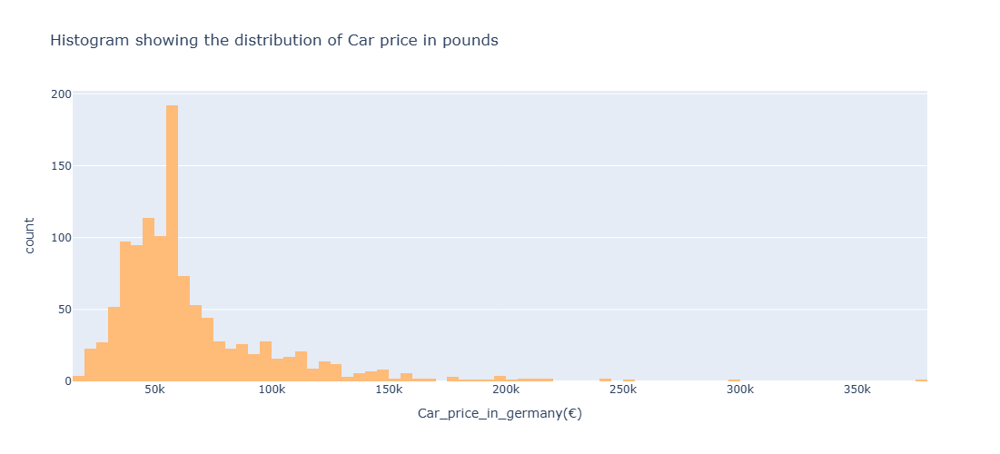

In [141]:
px.histogram(data_frame=df,x="Car_price_in_germany(€)"
             ,title="Histogram showing the distribution of Car price in pounds"
             ,width=1100, height=500
            ,color_discrete_sequence=['#FFBB78'])

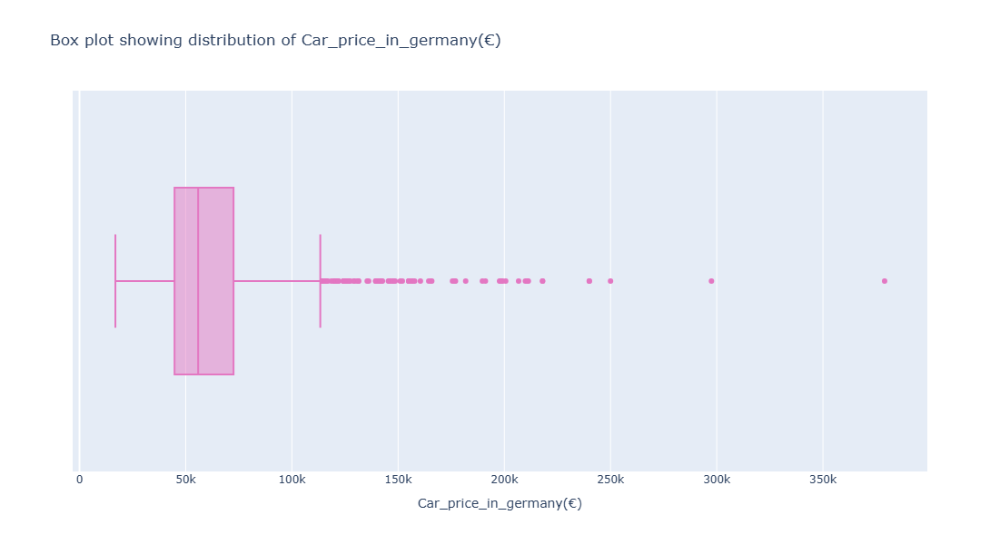

In [150]:
px.box(data_frame=df,x="Car_price_in_germany(€)"
       ,title="Box plot showing distribution of Car_price_in_germany(€)"
      ,width=800,height=600,color_discrete_sequence=['#E377C2'] )

In [148]:
A=df['Car_Brand'].value_counts().head(5)
A

Car_Brand
Mercedes      110
Tesla          84
Volkswagen     82
Audi           59
Porsche        57
Name: count, dtype: int64

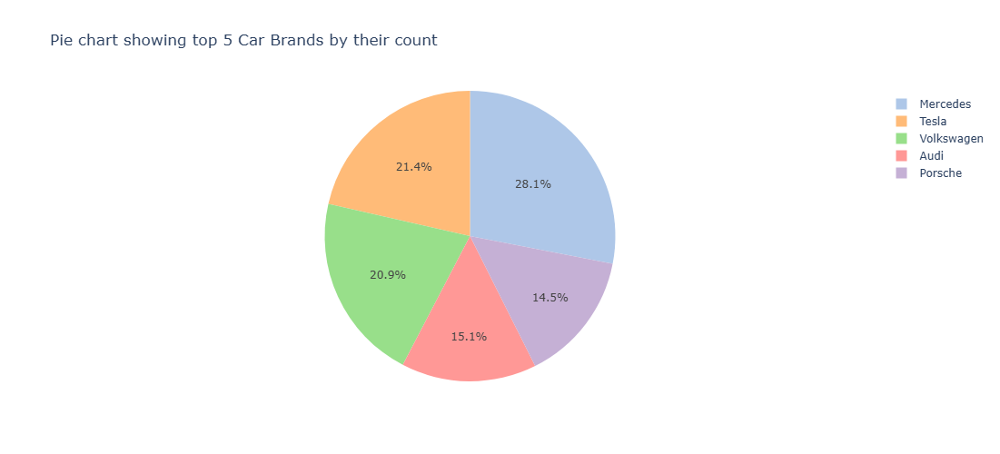

In [149]:
px.pie(data_frame=df,
    names=A.index,
    values=A.values,
    title="Pie chart showing top 5 Car Brands by their count",
    height=500,
    color_discrete_sequence=['#AEC7E8', '#FFBB78', '#98DF8A', '#FF9896', '#C5B0D5'])


#### Bi-Variate Analysis

In [108]:
df[['Range_in_km','Battery(KWH)']].corr()

,Range_in_km,Battery(KWH)
Range_in_km,1.000000,0.900471
Battery(KWH),0.900471,1.000000


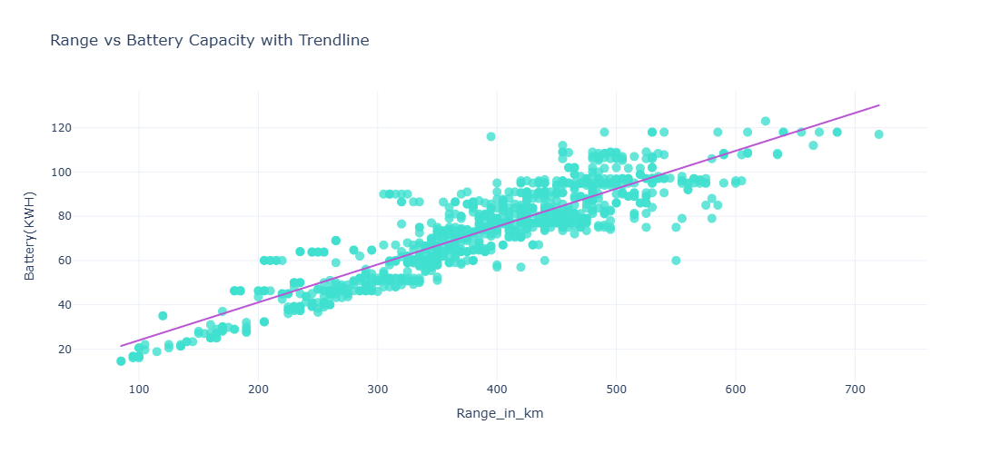

In [109]:
fig=px.scatter(data_frame=df,x='Range_in_km',y='Battery(KWH)'
           ,trendline='ols', trendline_color_override='mediumorchid',
           title='Range vs Battery Capacity with Trendline',
           width=700,height=500)

fig.update_traces(marker=dict(color='turquoise', size=10, opacity=0.8))
fig.update_layout(template='plotly_white')
fig.show();

#### Insights:

- Shows how range scales with battery size.
- Strong positive trend: higher Battery(KWH) → longer Range_in_km.
- Battery capacity and range are linearly correlated.

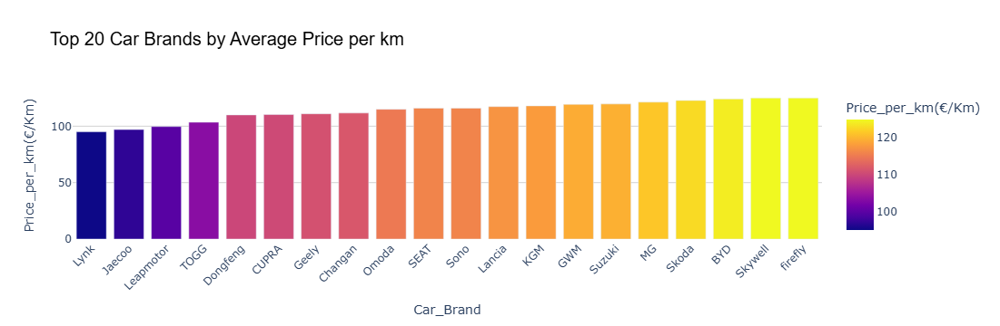

In [162]:
df1 = df.groupby(['Car_Brand'])['Price_per_km(€/Km)'].mean().sort_values().head(20)


df_bar = df1.reset_index()
df_bar.columns = ['Car_Brand', 'Price_per_km(€/Km)']

professional_colors = [
    '#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD',
    '#8C564B', '#E377C2', '#7F7F7F', '#BCBD22', '#17BECF',
    '#AEC7E8', '#FFBB78', '#98DF8A', '#FF9896', '#C5B0D5',
    '#C49C94', '#F7B6D2', '#C7C7C7', '#DBDB8D', '#9EDAE5']

fig=px.bar(data_frame=df_bar, x='Car_Brand', y='Price_per_km(€/Km)', 
           color='Price_per_km(€/Km)',
           title="Top 20 Car Brands by Average Price per km",color_discrete_sequence=professional_colors)


fig.update_layout(
    xaxis_tickangle=-45,
    showlegend=False,
    plot_bgcolor='white',
    title_font=dict(size=20, family='Arial', color='black'),
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=True, gridcolor='lightgray')
)

fig.show();

#### Insights

- Brands like Lynk, Jaecoo, Leapmotor, and TOGG have the lowest price per km, meaning they offer more cost-efficient driving.

- High-end brands appear toward the right (higher Price_per_km).

In [135]:
A=df.groupby(['Car_Brand'])['Range_per_kWh'].mean()
A=A.sort_values(ascending=False).head(20)

#### Multivariate Analysis 

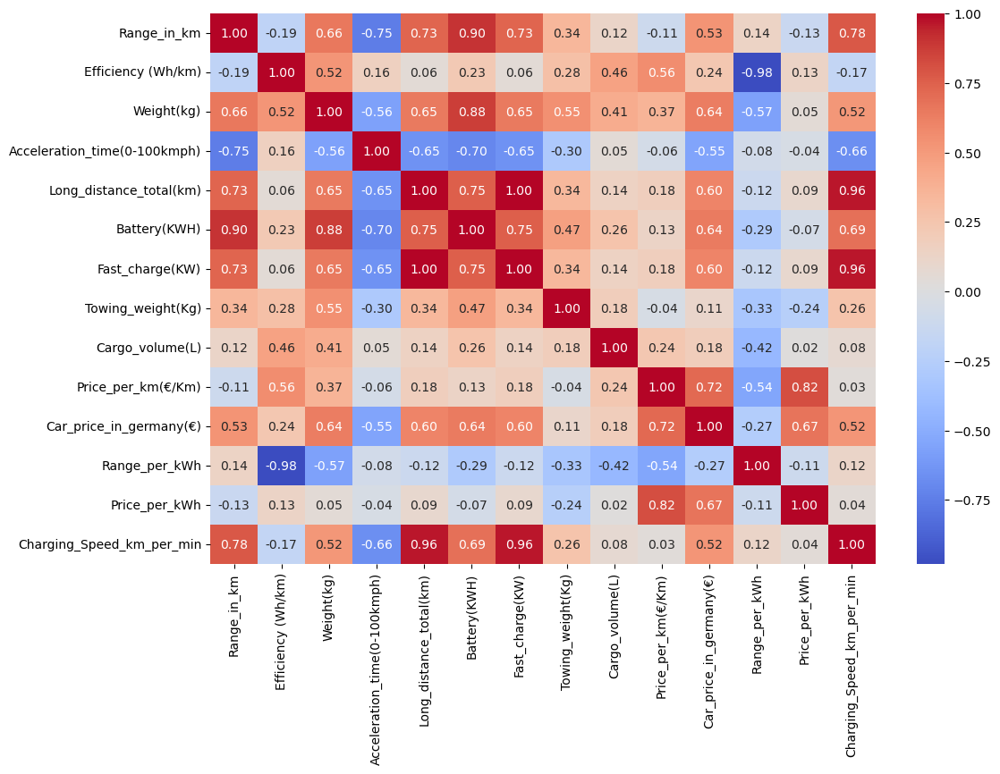

In [146]:

plt.figure(figsize=(12, 8))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.show();


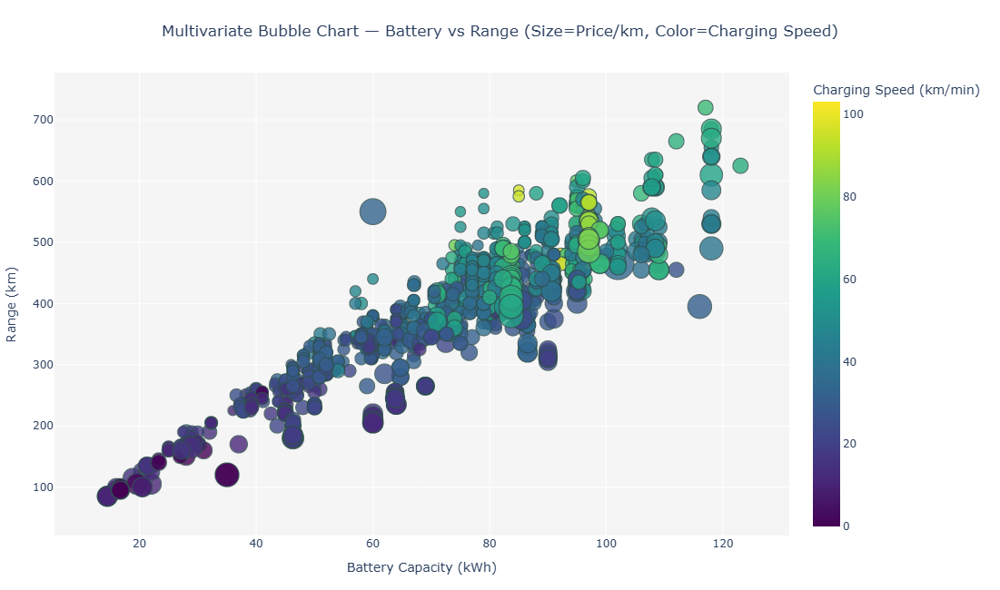

In [145]:

fig = px.scatter(df,
    x='Battery(KWH)',
    y='Range_in_km',
    size='Price_per_km(€/Km)',               
    color='Charging_Speed_km_per_min',       
    hover_name='Car_Brand',
    title='Multivariate Bubble Chart — Battery vs Range (Size=Price/km, Color=Charging Speed)',
    opacity=0.8,
    size_max=35,
    color_continuous_scale='Viridis',
    height=650)

fig.update_layout(
    title_x=0.5,
    plot_bgcolor='rgba(245,245,245,1)',
    paper_bgcolor='white',
    font=dict(size=12),
    xaxis_title='Battery Capacity (kWh)',
    yaxis_title='Range (km)',
    coloraxis_colorbar=dict(title='Charging Speed (km/min)'),
    margin=dict(t=80, b=60, l=60, r=60))

fig.update_traces(marker=dict(line=dict(width=1, color='DarkSlateGrey')))
fig.show();


#### Insights:

- X-axis (Range_per_kWh): Efficiency — more distance per energy.
- Y-axis (Price_per_kWh): Cost efficiency — how much each kWh “costs”.
- Bubble size (Battery): Represents energy capacity.
- Color: Car pricing segment.